In [1]:
import os
import pandas as pd
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 2000)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms
plt.style.use('fivethirtyeight')

In [2]:
# Import relevant dataframes:

main_table = pd.read_csv(r"C:\Users\bob65\Documents\Summer2019_Research\PythonFiles\_Data\Brandeis_Main_Table_updated_7122019.csv")
print(len(main_table))
faculty_table = pd.read_csv(r"C:\Users\bob65\Documents\Summer2019_Research\PythonFiles\_Data\Brandeis_Dummy_Table_Updated_06192019.csv")
print(len(faculty_table))
# skill_table = pd.read_csv(r"C:\Users\bob65\Documents\Summer2019_Research\PythonFiles\_Data\Brandeis_Skill_Table.csv")
# print(len(skill_table))

3957167
3948821


In [5]:
#####################################################
# Share of faculty vs Non-Faculty Openings: 2007-2017
# Group by type of institution
#####################################################

# Method:
# (1) You want to be able to work with only the data from the table that is relevant to you. Therefore,
# first begin by merging the main_table and dummy_table on 'Job ID', and then keep the following 
# columns: [Job ID, Career Area, Year, IPEDS Sector Name, Is Research 1 Instiotution?, Post-Doctoral,
# Faculty, Health sciences, Number of Detailed Fields of Study]. We choose these categories 
# because we would like to be able to divide the listings into subgroups and exclude certain edge 
# case observations. 

# (2) Next we want to get rid of the edge case observations previously mentioned. To do this we will
# drop all listings for which the 'Post-Doctoral' dummy is equal to 1; this excludes the category of
# Post-docs that generally do not fit in with the other categories we are studying. Then we want to 
# exclude all jobs that are exclusively in the Healthcare industry or Health Sciences field. We must
# do it for both the faculty and non-faculty observations; non-faculty can be removed if their career
# area is 'Health Care including Nursing'. Faculty is slightly more complex since some faculty members
# are not specialized exclusivly in the Health sciences field. Therefore, we want to exclude all
# faculty listings that have only one 'Detailed Fields of Study' and are in the 'Health sciences' NSF 
# Field of Study ('Detailed Fields of Study' == 1 && 'Health sciences' == 1). You can also think of 
# this step as keeping all lsitings with 2 fields described, or those not in the Health sciences.
# Lastly we want to omit all years other than 2007 and 2017 in order to compare the relative shares
# of faculty and non-faculty, so drop all observations for which 'Year' is not equal to 2007 or 2017.

# (3) Next we want to be able to decribe the type of institution that the listing comes from, there
# are some rules for these caregories: We want to divide them into All-Higher Education, R1 
# Universities, 4-Year Institutions, and 2-Year Institutions. R1 is easy since a dummy already exists
# for that category, for the others we will have to parse the string values in the 'IPEDS Sector Name'
# column. Here are the rules for that: Any observation that contains the substring '2-year' is a
# 2-Year Institution, any observation that contains the substrings '4-year' or 'Admin' are 4-Year 
# Institutions, and the rest are unknown values that we must omit from the anlayis. In this case new 
# dummy variables were created within the analysis for 2-year and 4-year.

# (4) Optional: Drop all of the now useless varaibles in order to trim down the useless information
# on the tables used for graphing.

# (5) Finally we will group the values by Year and Faculty. This will proivide us with 4 values in
# each case: one non-faculty number and one faculty number for each year. For each category other
# than the basic 'All Higher Education', simply filter the data based on wheter the dummy you 
# generated is 1 or 0 (e.g. group table by (Year, Faculty) if 'Is Research 1 Institution' == 1)

# Caveats: Some of the categorizatons do not behave in a mannor that we would expect at this time. 
# Unfortuneately, the one problem that is still present in this example is that occasionally
# Faculty and Non-Faculty will be miscategorized such that jobs that one would expect to belong in
# the faculty category are pushed to the non-faculty side. The issue arrises from the inconsistency
# with which it happens, and therefore it cannot be easily accounted for. Therefore, as of now there
# is no complete solution to this, but one is pending waiting further investiagtion into these edge
# cases.

# (1) Merge the dataframes so that we have the target fields that we want (Job ID, Year, R1, Sector, and Post-Docs/Fauculty)
full_table = main_table[['Job ID', 'Career Area', 'Year', 'IPEDS Sector Name', 'R1', '4-year', '2-year']].merge(
    faculty_table[['Job ID', 'Post-Doctoral', 'Faculty', 'Health sciences', 'Number of Detailed Fields of Study']],
    how='outer', on="Job ID" )

# (2) Drop all observations of Post-Docs, Health-Science Non-Faculty, irrelevant years, and Health-Science Exclusive Faculty
full_table = full_table[full_table['Post-Doctoral'] != 1]
full_table = full_table[full_table['Career Area'] != 'Health Care including Nursing']
full_table = full_table[((full_table['Number of Detailed Fields of Study'] > 2) | (full_table['Health sciences'] != 1))]
full_table = full_table[(full_table['Year'] == 2007) | (full_table['Year'] == 2017)]

# (3) Parse IPEDS Column:
# 4-year
# four_year = full_table['IPEDS Sector Name'].str.contains('4-year')
# four_year = four_year + full_table['IPEDS Sector Name'].str.contains('Admin')
# full_table['4-year'] = four_year + 0
# # 2-Year
# two_year = full_table['IPEDS Sector Name'].str.contains(', 2-year')
# full_table['2-year'] = two_year + 0

# (4) Drop now useless columns
full_table = full_table[['Job ID', 'Year', 'Faculty', 'R1', '4-year', '2-year']]

In [6]:
def faculty_differences(df, title):
    faculty = np.zeros(2)
    non_fac = np.zeros(2)
    for index, row in df.iterrows():
        if row['Year'] == 2007:
            if row['Faculty'] == 0:
                non_fac[0] = row['Job ID']
            else:
                faculty[0] = row['Job ID']
        else:
            if row['Faculty'] == 0:
                non_fac[1] = row['Job ID']
            else:
                faculty[1] = row['Job ID']
                
    years = ['2007', '2017']
    ind = np.array([x for x, _ in enumerate(years)])

    total = faculty + non_fac

    prop_fac = np.true_divide(faculty, total) * 100
    prop_non = np.true_divide(non_fac, total) * 100

    plt.bar(ind, prop_fac, width=0.5, label='Faculty', color='blue', bottom=prop_non)
    plt.bar(ind, prop_non, width=0.5, label='Non-Faculty', color='gold')
    # plt.bar(ind + 0.5,100, width=0.01, label='', color = 'black')

    for k in range(len(ind)):
        plt.annotate(s='(' + str(round(prop_fac[k], 1)) + '%)', xy=(ind[k]-0.1, prop_non[k]+0.5*prop_fac[k]))
        plt.annotate(s='(' + str(round(prop_non[k], 1)) + '%)', xy=(ind[k]-0.1, 0.5*prop_non[k]))

    plt.xticks(ind, years)
    plt.ylabel('Proportion')
    plt.xlabel('Year')
    plt.title(title)

    plt.legend(loc='lower center')
    plt.show()

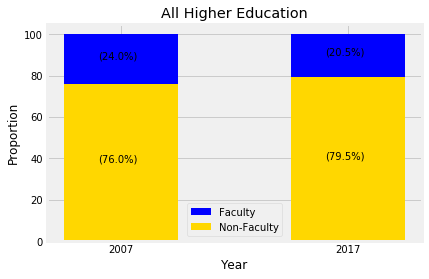

In [7]:
# All higher education differneces
all_higher_ed = pd.DataFrame(full_table.groupby(by=['Year', 'Faculty']).count()['Job ID']).reset_index()

faculty_differences(all_higher_ed, 'All Higher Education')

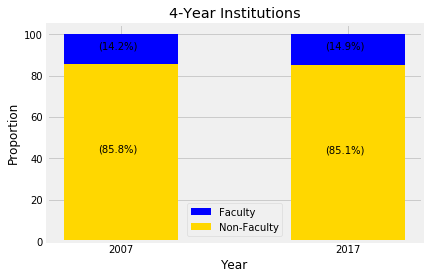

In [8]:
# 4-Year institutions differences
four_year_inst = pd.DataFrame(full_table[full_table['4-year'] == 1].groupby(
    by=['Year', 'Faculty']).count()['Job ID']).reset_index()

faculty_differences(four_year_inst, '4-Year Institutions')

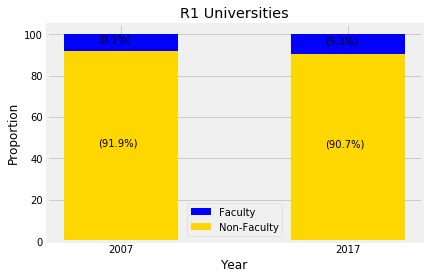

In [9]:
# R1 University differences
research_one = pd.DataFrame(full_table[full_table['R1'] == 1].groupby(by=['Year', 'Faculty']).count()['Job ID']).reset_index()

faculty_differences(research_one, 'R1 Universities')

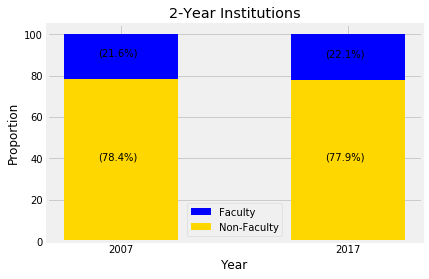

In [10]:
# 2-Year institutions differences
two_years = pd.DataFrame(full_table[full_table['2-year'] == 1].groupby(by=['Year', 'Faculty']).count()['Job ID']).reset_index()

faculty_differences(two_years, "2-Year Institutions")

In [11]:
del(full_table)

In [275]:
#################################################
# All Faculty Openings: 2010-1017
# Group by Employee type and by institution type
#################################################
# Method:

# (1) First choose the relevant data for the making of the graph. We want to divide the faculty
# listings into their type of faculty (Tenure-Line, Full-time Contingent, and Part-time Contingent)
# as well as divide the listings within those catagories by their IPEDS institution name, therefore,
# we will need the following columns: ['Job ID', 'Year', 'IPEDS Sector Name', 'Is Research 1 
# Institution?', 'Post-Doctoral', 'Faculty', 'Health sciences', 'Number of Detailed Fields of Study',
# 'Contingent', 'Full-time Contingent', 'Part-time Contingent', 'Tenured', 'Tenured_Track']. We will
# be using these to divide up our data, as well as get rid of certain edge case observations that
# confound the dataset.

# (2) Next we want to get rid of the edge case observations previously mentioned. To do this we will
# drop all listings for which the 'Post-Doctoral' dummy is equal to 1; this excludes the category of
# Post-docs that generally do not fit in with the other categories we are studying. Then we want to 
# exclude all jobs that are exclusively in the Healthcare industry or Health Sciences field. We must
# do it for both the faculty and non-faculty observations; non-faculty can be removed if their career
# area is 'Health Care including Nursing'. Faculty is slightly more complex since some faculty members
# are not specialized exclusivly in the Health sciences field. Therefore, we want to exclude all
# faculty listings that have only one 'Detailed Fields of Study' and are in the 'Health sciences' NSF 
# Field of Study ('Detailed Fields of Study' == 1 && 'Health sciences' == 1). You can also think of 
# this step as keeping all lsitings with 2 fields described, or those not in the Health sciences.
# Lastly we want to omit all years other than 2010 and 2017 in order to compare the growth of the 
# job categories from both years, so drop all observations for which 'Year' is not equal to 2010 or 
# 2017.

# (3) Next we do a series of manipulations designed to clarify the Tenure-Line and Contingent varaiables.
# These are necessary since some observations do not have mutual exclusivity between tenure varaibles
# and contingent varaibles. Therefore, we manually exclude them in favor of the tenure catagory. These
# manipulations can be described as follows: Construct tenure line as the union between Tenured and 
# Tenured_Track (sum the two and then limit the max value to 1), Replace contingent with 0 if 
# Tenure_Line is 1, replace Full-time and Part-time Contingent with 0 if Tenure_Line is 1.

# (4) Then we want to be able to decribe the type of institution that the listing comes from, there
# are some rules for these caregories: We want to divide them into All-Higher Education, R1 
# Universities, 4-Year Institutions, and 2-Year Institutions. R1 is easy since a dummy already exists
# for that category, for the others we will have to parse the string values in the 'IPEDS Sector Name'
# column. Here are the rules for that: Any observation that contains the substring '2-year' is a
# 2-Year Institution, any observation that contains the substrings '4-year' or 'Admin' are 4-Year 
# Institutions, and the rest are unknown values that we must omit from the anlayis. In this case new 
# dummy variables were created within the analysis for 2-year and 4-year. In the future these dummies
# will be included in the dataset in order to streamline this step and allow the data to be more
# understandable.

# (1) Merge the dataframes so that we have the target fields that we want (Job ID, Year, R1, Sector, and Post-Docs/Fauculty)
full_table = main_table[['Job ID', 'Year', 'IPEDS Sector Name', 'Is Research 1 Institution?']].merge(
    faculty_table[['Job ID', 'Post-Doctoral', 'Faculty', 'Health sciences', 'Number of Detailed Fields of Study', 
                   'Contingent', 'Full-time Contingent', 'Part-time Contingent', 'Tenured', 'Tenured_Track']],
    how='inner', on="Job ID" )

# Rename R1
full_table.rename(columns={'Is Research 1 Institution?':'R1'}, inplace=True)

# (2) Drop all observations of Post-Docs, Health-Science Non-Faculty, irrelevant years, and Health-Science Exclusive Faculty
# as well as non-faculty personnel
full_table = full_table[full_table['Post-Doctoral'] != 1]
full_table = full_table[full_table['Faculty'] == 1]
full_table = full_table[((full_table['Number of Detailed Fields of Study'] > 2) | (full_table['Health sciences'] != 1))]
full_table = full_table[(full_table['Year'] == 2010) | (full_table['Year'] == 2017)]
full_table = full_table[(full_table['IPEDS Sector Name'] != 'nan') & 
                        (full_table['IPEDS Sector Name'] != 'Sector unknown (not active')]

# (3) Tenure_Line / Contingent Manipualtion
# Clarify the Tenure Line variable
full_table['Tenure-Line'] = full_table['Tenured'] + full_table['Tenured_Track']
full_table['Tenure-Line'].where(full_table['Tenure-Line'] < 2, 1, inplace=True)

# Mutually exclude Tenure-Line and Contingent
'''
If Tenure-Line is 1 AND Contingent is 0 OR Tenure-Line is 0 AND Contingent is 1, leave contingent alone;
Otherwise it must be replaced with 0
'''
full_table['Contingent'].where(((full_table['Tenure-Line'] > 0) & (full_table['Contingent'] < 1) |
                                (full_table['Tenure-Line'] < 1) & (full_table['Contingent'] > 0)), 0, inplace=True)
'''
If Tenure-Line is 1, FTC and PTC should be 0
'''
full_table['Full-time Contingent'].where(full_table['Tenure-Line'] < 1, 0, inplace=True)
full_table['Part-time Contingent'].where(full_table['Tenure-Line'] < 1, 0, inplace=True)

# (4) Parse IPEDS Column
# 4-year
four_year = full_table['IPEDS Sector Name'].str.contains('4-year')
four_year = four_year + full_table['IPEDS Sector Name'].str.contains('Admin')
full_table['4-year'] = four_year + 0
# 2-Year
two_year = full_table['IPEDS Sector Name'].str.contains(', 2-year')
full_table['2-year'] = two_year + 0

# Drop now useless columns
full_table = full_table[['Job ID', 'Year', 'Faculty', 'R1', '4-year', '2-year', 'Tenure-Line', 'Contingent',
                         'Full-time Contingent', 'Part-time Contingent']]

In [276]:
plt.style.use('classic')

def faculty_openings(df, title, contingent=False):
    if(not(contingent)):
        ten = np.zeros(4)
        seventeen = np.zeros(4)
        for index, row in df.iterrows():
            if row['Year'] == 2010:
                ten[0] += row['Job ID']
                if row['4-year'] == 1:
                    ten[1] += row['Job ID']
                if row['R1'] == 1:
                    ten[2] += row['Job ID']
                if row['2-year'] == 1:
                    ten[3] += row['Job ID']
            else:
                seventeen[0] += row['Job ID']
                if row['4-year'] == 1:
                    seventeen[1] += row['Job ID']
                if row['R1'] == 1:
                    seventeen[2] += row['Job ID']
                if row['2-year'] == 1:
                    seventeen[3] += row['Job ID']
    else:
        cont_ten = np.zeros((4,3))
        cont_seventeen = np.zeros((4,3))
        for index, row in df.iterrows():
            if row['Year'] == 2010:
                cont_ten[0,0] += row['Job ID']
                if(row['Full-time Contingent'] == 1):
                    cont_ten[0,1] += row['Job ID']
                if(row['Part-time Contingent'] == 1):
                    cont_ten[0,2] += row['Job ID']
                if row['4-year'] == 1:
                    cont_ten[1,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_ten[1,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_ten[1,2] += row['Job ID']
                if row['R1'] == 1:
                    cont_ten[2,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_ten[2,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_ten[2,2] += row['Job ID']
                if row['2-year'] == 1:
                    cont_ten[3,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_ten[3,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_ten[3,2] += row['Job ID']
            else:
                cont_seventeen[0,0] += row['Job ID']
                if(row['Full-time Contingent'] == 1):
                    cont_seventeen[0,1] += row['Job ID']
                if(row['Part-time Contingent'] == 1):
                    cont_seventeen[0,2] += row['Job ID']
                if row['4-year'] == 1:
                    cont_seventeen[1,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_seventeen[1,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_seventeen[1,2] += row['Job ID']
                if row['R1'] == 1:
                    cont_seventeen[2,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_seventeen[2,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_seventeen[2,2] += row['Job ID']
                if row['2-year'] == 1:
                    cont_seventeen[3,0] += row['Job ID']
                    if(row['Full-time Contingent'] == 1):
                        cont_seventeen[3,1] += row['Job ID']
                    if(row['Part-time Contingent'] == 1):
                        cont_seventeen[3,2] += row['Job ID']

        # Calculate the sum of all contingent job postings                
        sum_ten = cont_ten[:,1] + cont_ten[:,2]
        sum_seventeen = cont_seventeen[:,1] + cont_seventeen[:,2]
        
        # Use the ratio of FTC to PTC to calcualte the total projected amount of FTC jobs
        cont_ten[:,1] = np.true_divide(cont_ten[:,1], sum_ten) * cont_ten[:,0]
        cont_seventeen[:,1] = np.true_divide(cont_seventeen[:,1], sum_seventeen) * cont_seventeen[:,0]

        # Use the ratio of PTC to FTC to calculate the total projected amount of FTC jobs
        cont_ten[:,2] = np.true_divide(cont_ten[:,2], sum_ten) * cont_ten[:,0]
        cont_seventeen[:,2] = np.true_divide(cont_seventeen[:,2], sum_seventeen) * cont_seventeen[:,0]
        
    repeat = False
    i = 0
    if(contingent):
        repeat = True
        i = 1
    while(True):
        
        if(repeat & i == 1):
            ten = cont_ten[:,1]
            seventeen = cont_seventeen[:,1]
            title = 'Full-Time Contingent Positions'
            i += 1
        elif(i == 2):
            ten = cont_ten[:,2]
            seventeen = cont_seventeen[:,2]
            title = 'Part-Time Contingent Positions'
        
        institutions = ['All Higher Education', '4-Year Institutions', 'R1 Universities', '2-Year Universities']
        ind = np.array([x for x, _ in enumerate(institutions)])

        growth = np.true_divide((ten-seventeen)*-1, ten) * 100

        width = 0.35
        plt.barh(ind, seventeen, width, label='2017', color='gold')
        plt.barh(ind+width, ten, width, label='2010', color='blue')


        plt.yticks(ind, institutions)
        plt.ylabel('Institution Type')
        plt.xlabel('Number of Postings')
        plt.title(title)

        for k in range(4):
            plt.annotate(s=str(round(growth[k],1)) + '% Growth', xy=(seventeen[k]+250, ind[k]))

        plt.legend(loc='upper right')

        plt.show()
        if(repeat):
            repeat = False
            continue
        else:
            break

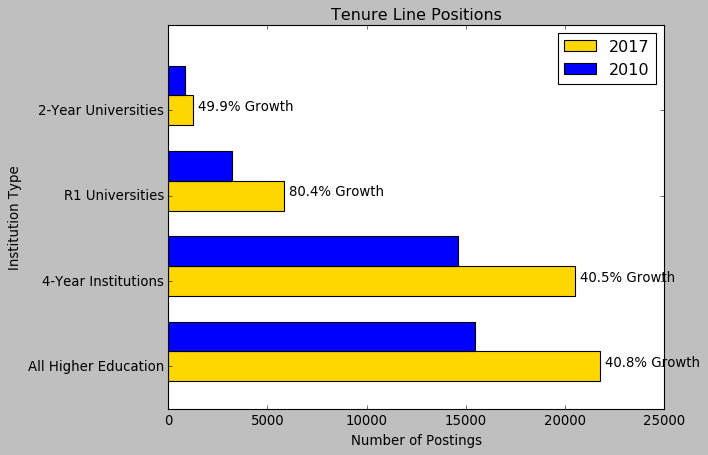

In [277]:
faculty_openings(pd.DataFrame(full_table[full_table['Tenure-Line']==1].groupby(by=['4-year','R1', '2-year', 'Year'])
             ['Job ID'].count()).reset_index(), 'Tenure Line Positions')

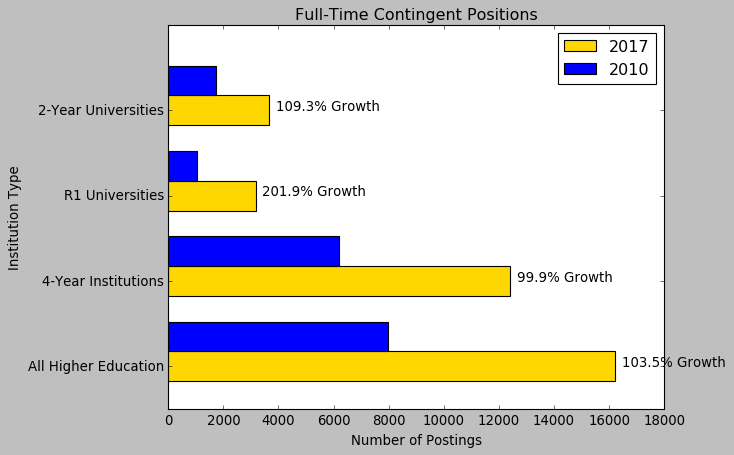

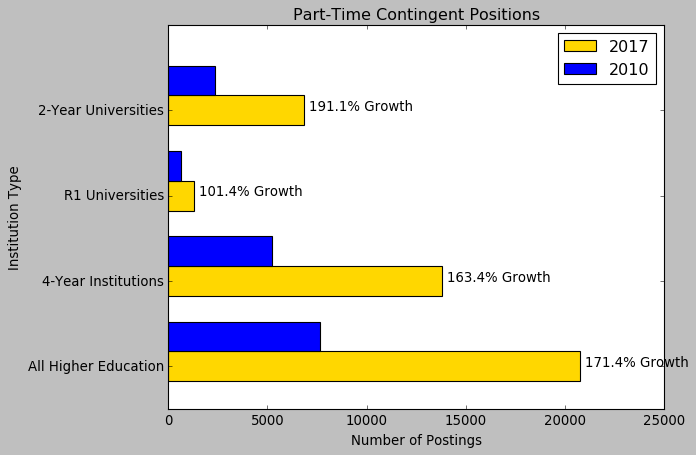

In [278]:
faculty_openings(pd.DataFrame(full_table[(full_table['Contingent']==1)].groupby(by=['4-year','R1', '2-year', 'Year', 'Full-time Contingent',
                                                                   'Part-time Contingent'])
             ['Job ID'].count()).reset_index(), 'None', contingent=True)

In [279]:
del(full_table)

In [12]:
#########################################################
# Growth of Job Postings by NSF Field of Study: 2007-2017
#########################################################

# Method

# (1) Gather relevant data. While the dataframe declarations in this example look the most 
# complex, this graph actaually requires no merging since all we need is contained within
# the faculty dummy table file. We will need to drop all observatiosn of non-faculty,
# Post-Doctoral students, and Health sciences exclusive postings.

# (2) Then pass to the graphing functions the sum of the relevant NSF catagories in a new 
# dataframe. This incldes all catagories except for Health sciences and Other arts and 
# humanities. Health sciences is omitted for obvious reasons in part (1), and Other arts
# and humanities is omitted because the caatgory seems to be non-descriptive in the state
# that it came from Burning-Glass. More analysis is needed to determine if it is fixable.

full_table = faculty_table.merge(main_table.drop(columns='Year'), how='inner', on='Job ID')

full_table = full_table[full_table['R1']==1]
full_table = full_table[~((full_table['Job Title'].str.contains('Open Rank', case=False, na=False)&(full_table['Other humanities and arts']==1)))]
full_table = full_table[full_table['Private']==1]
full_table = full_table[(full_table['Faculty']==1)]
full_table = full_table[(full_table['Post-Doctoral']==0)]
full_table = full_table[((full_table['Health sciences'] != 1) | (full_table['Number of Detailed Fields of Study'] > 1))]

NSF_07 = pd.DataFrame(full_table[full_table['Year']==2007][['Economics', 'Computer and information sciences',
                                                            'Biological and biomedical sciences', 'FS_Engineering',
                                                            'Other social sciences', 'Other humanities and arts',
                                                            'Business management and administration', 'Psychology',
                                                            'Anthropology', 'Political science and government',
                                                            'Mathematics and statistics', 'Chemistry',
                                                            'Foreign languages and literature', 'Letters', 'History',
                                                            'Geosciences, atmospheric, and ocean sciences', 'Sociology',
                                                            'Physics and astronomy', 'FS_Education'
                                                           ]].sum()).reset_index().rename(columns={0:'count'})
NSF_17 = pd.DataFrame(full_table[full_table['Year']==2017][['Economics', 'Computer and information sciences',
                                                            'Biological and biomedical sciences', 'FS_Engineering',
                                                            'Other social sciences', 'Other humanities and arts',
                                                            'Business management and administration', 'Psychology',
                                                            'Anthropology', 'Political science and government',
                                                            'Mathematics and statistics', 'Chemistry', 
                                                            'Foreign languages and literature', 'Letters', 'History',
                                                            'Geosciences, atmospheric, and ocean sciences', 'Sociology',
                                                            'Physics and astronomy', 'FS_Education'
                                                           ]].sum()).reset_index().rename(columns={0:'count'})

In [10]:
def NSF_Growth(df_start, df_end, title):
    catagories = list()
    for index, row in df_end.iterrows():
        catagories.append(row['index'])
    counts = np.zeros((len(catagories), 2))
    for i in range(len(catagories)):
        counts[i,0] = df_start['count'][df_start['index']==catagories[i]].values
        counts[i,1] = df_end['count'][df_end['index']==catagories[i]].values   
    
    ind = np.array([x for x, _ in enumerate(catagories)])

    growth = np.true_divide((counts[:,0]-counts[:,1])*-1,counts[:,0]) * 100

    for k in range(len(growth)):
       # print(growth[k], counts[k,:], ind[k])
        plt.annotate(s=str(round(growth[k],1)) + '% Growth', xy=(counts[k,1]+100, ind[k]))
        
    width = 0.2
    
    plt.barh(ind, counts[:,1], width, label='2017', color='blue')
    plt.barh(ind + width, counts[:,0], width, label='2007', color='gold')

    plt.yticks(ind, catagories, fontsize='small')
    plt.ylabel('NSF Catagory')
    plt.xlabel('Number of Postings')
    plt.title(title)

    plt.legend(loc='upper right')
    
    fig = plt.gcf()
    
    plt.show()

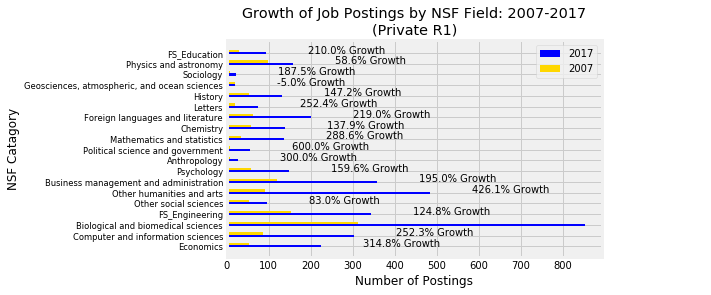

In [13]:
NSF_Growth(NSF_07, NSF_17, 'Growth of Job Postings by NSF Field: 2007-2017\n(Private R1)')

In [288]:
del(NSF_07, NSF_17)

In [84]:
faculty_table

,Unnamed: 0,Unnamed: 0.1,Job ID,Year,Diversity and Inclusion,Post-Doctoral,Faculty,Agricultural sciences and natural resources,Biological and biomedical sciences,Health sciences,Chemistry,"Geosciences, atmospheric, and ocean sciences",Physics and astronomy,Computer and information sciences,Mathematics and statistics,Psychology,Anthropology,Economics,Political science and government,Sociology,Other social sciences,"Aerospace, aeronautical, and astronautical engineering",Bioengineering and biomedical engineering,Chemical engineering,Civil engineering,"Electrical, electronics, and communications engineering",Industrial and manufacturing engineering,Materials science engineering,Mechanical engineering,Other engineering,Education administration,Education research,Teacher education,Teaching fields,Other education,Foreign languages and literature,History,Letters,Other humanities and arts,Business management and administration,Communication,Number of Detailed Fields of Study,FS_Life_sciences,FS_Physical_sciences_and_earth_sciences,FS_Mathematics_and_computer_sciences,FS_Psychology_and_social_sciences,FS_Engineering,FS_Education,FS_Humanities_and_arts,FS_Others,Tenured,Tenured_Track,Contingent,Full-time Contingent,Part-time Contingent,Tenure-Line,Tenure_Line,Overall Engineering,Overall Education
0,0,0,263402020,2007,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1
1,1,1,263610222,2007,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1
2,2,2,264122260,2007,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,3,3,264366566,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0
4,4,4,264541674,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0
5,5,5,264582053,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0
6,6,6,264642838,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,7,7,265029081,2007,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,0
8,8,8,265339568,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,9,9,265339968,2007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [24]:
###########################################
# Sciences Faculty Job Openings Composition
# All Higher-Education, 2010-2017
###########################################
# Method:

# This is a relatively hard slide to recreate. It has multiple layers that must be graphed together
# on one single figure in order to show the desired information in an effective manner. However,
# once the desired data is aquired in a workable format, the process of graphing the data is 
# entirely dependent upon the visualization software that one uses. Therefore, I will cover the
# compilation of the data here.

# Since we want to display both nominal job postings counts and relative shares for various NSF 
# Science fields all we need is counts for these catagories in the two relevant years. This
# will be fairly simple to do.

# (1) Select Desired Columns:
#     Here we choose all of the relevant columns that will be used in the calculation of categories
#     for the final visualization. You wiull notice that the column names have changed for some of
#     the categories. This is because I have done this in my sample for my own ease of use. This
#     For example 'Is Research 1 Institution?' now reads simply 'R1'; These are the same variables.
    
# (2) Filter Data:
#     Here we want to drop all Post-Doc observations, all non-faculty, remove health-sciences 
#     faculty, and restrict the years of observations to 2010 and 2017


# (1) Select Desired Columns
full_table = main_table[['Job ID', 'Year', 'R1', 'IPEDS Sector Name', '4-year', '2-year']].merge(
    faculty_table[['Job ID', 'Biological and biomedical sciences', 'Chemistry', 'Computer and information sciences',
                   'Mathematics and statistics', 'Health sciences', 'Number of Detailed Fields of Study', 'Faculty',
                   'Post-Doctoral', 'Contingent', 'Tenure_Line']], how='inner', on='Job ID')

# (2) Filter Data
full_table = full_table[full_table['Post-Doctoral'] == 0]
full_table = full_table[full_table['Faculty'] == 1]
full_table = full_table[((full_table['Number of Detailed Fields of Study'] > 1) | (full_table['Health sciences'] != 1))]
full_table = full_table[(full_table['Year'] == 2010) | (full_table['Year'] == 2017)]
# full_table = full_table[(full_table['IPEDS Sector Name'] != 'nan') & 
#                         (full_table['IPEDS Sector Name'] != 'Sector unknown (not active')]


In [25]:
# This code here features some pretty bad hard coding. This was from early in my time with Python
# before I had gotten used to the way iteration works within it. It is fully operational as it
# stands, but feel free to change this into a format that is more workable for you.

def sciences_relative(df, title):
    totals = np.zeros((4,2))
    shares = np.zeros((4,2,2))
    
    catagories = ['Biological and\nBiomedical Sciences', 'Chemistry', 'Computer and\nInformation Sciences', 
                    'Mathematics\nand Statistics']
    
    for index, row in df.iterrows():
        if row['Year']==2010:
            if row['Biological and biomedical sciences'] == 1:
                totals[0,0] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[0,0,0] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[0,1,0] += row['Job ID']
            if row['Chemistry'] == 1:
                totals[1,0] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[1,0,0] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[1,1,0] += row['Job ID']
            if row['Computer and information sciences'] == 1:
                totals[2,0] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[2,0,0] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[2,1,0] += row['Job ID']
            if row['Mathematics and statistics'] == 1:
                totals[3,0] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[3,0,0] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[3,1,0] += row['Job ID']
        if row['Year']==2017:
            if row['Biological and biomedical sciences'] == 1:
                totals[0,1] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[0,0,1] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[0,1,1] += row['Job ID']
            if row['Chemistry'] == 1:
                totals[1,1] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[1,0,1] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[1,1,1] += row['Job ID']
            if row['Computer and information sciences'] == 1:
                totals[2,1] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[2,0,1] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[2,1,1] += row['Job ID']
            if row['Mathematics and statistics'] == 1:
                totals[3,1] += row['Job ID']
                if row['Tenure_Line'] == 1:
                    shares[3,0,1] += row['Job ID']
                if row['Contingent'] == 1:
                    shares[3,1,1] += row['Job ID']
                    
    print(totals)              
    
    fig, ax1 = plt.subplots()
    
    ind = np.array([x for x, _ in enumerate(catagories)])
    
    cont_tenure = shares[:,0,:] + shares[:,1,:]
    shares[:,0,:] = np.true_divide(shares[:,0,:], cont_tenure)
    shares[:,1,:] = np.true_divide(shares[:,1,:], cont_tenure)
    
    width = 0.35
    delta = 0.1
    ax1.bar(ind, totals[:,0], width, label='2010L, 2017R', color='grey')
    ax1.bar(ind + width + delta, totals[:,1], width, color ='grey')
    ax1.xaxis.set_ticks(ind + (width + delta)/2)
    ax1.xaxis.set_ticklabels(catagories, rotation=15, fontsize='small', horizontalalignment ='center')
    ax1.set_xlabel('NSF Field')
    ax1.set_ylabel('Number of Postings')
    
    ax2 = ax1.twinx()
    
    width2 = 0.07
    delta2 = 0.03
    ax2.bar(ind-width2, shares[:,0,0], width2, label='Tenure-Line Share', color='blue')
    ax2.bar(ind+width+delta-width2, shares[:,0,1], width2, color='blue')
    ax2.bar(ind+width2, shares[:,1,0], width2, label='Contingent Share', color='yellow')
    ax2.bar(ind+width+delta+width2, shares[:,1,1], width2, color='yellow')
    ax2.set_ylabel('Share of Postings')
    ax2.set_ylim(top=1.0)
             
    fig.set_size_inches(11,8)
    fig.legend(loc='upper right')
    plt.title(title)
    
#     Here is the function for saving PyPlot files to png. The bbox_inches argument is there to
#     make the whitespace that appears around the edge of the chart slightly less prominent. 
#     The chart can also be saved as a pdf which greatly increases the resolution, but I am not
#     sure if that would be compatible with your portal.
    
#     plt.savefig('Sciences_Faculty.png', bbox_inches='tight')

[[ 7580. 14392.]
 [ 2759.  4577.]
 [ 3999.  8693.]
 [ 3476.  5531.]]


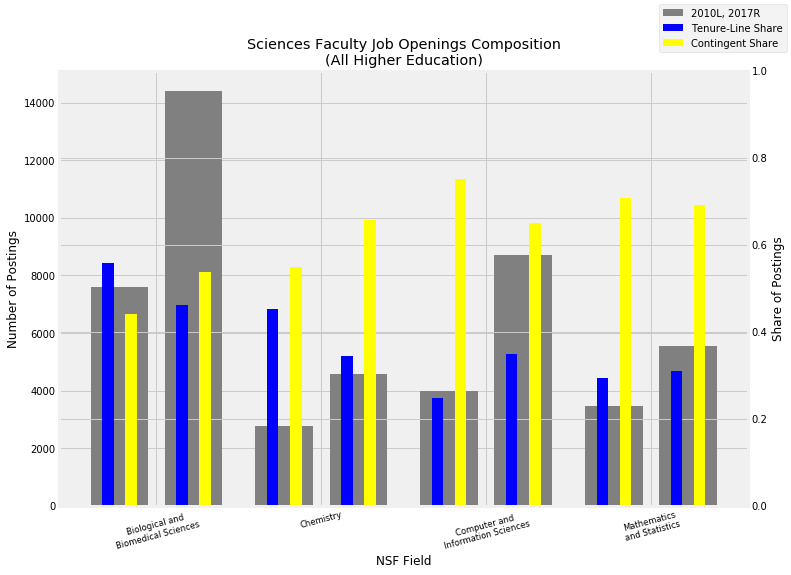

In [26]:
sciences_relative(pd.DataFrame(full_table.groupby(['Year', 'Contingent', 'Tenure_Line', 'Biological and biomedical sciences', 'Chemistry',
                    'Computer and information sciences', 'Mathematics and statistics']).count()['Job ID']).reset_index(),
                  'Sciences Faculty Job Openings Composition\n(All Higher Education)')

In [12]:
pd.DataFrame(full_table.groupby(['Year', 'Contingent', 'Tenure_Line', 'Biological and biomedical sciences', 'Chemistry',
                    'Computer and information sciences', 'Mathematics and statistics']).count()['Job ID']).reset_index()

,Year,Contingent,Tenure_Line,Biological and biomedical sciences,Chemistry,Computer and information sciences,Mathematics and statistics,Job ID
0,2010,0,0,0,0,0,0,8873
1,2010,0,0,0,0,0,1,322
2,2010,0,0,0,0,1,0,997
3,2010,0,0,0,1,0,0,264
4,2010,0,0,0,1,0,1,2
5,2010,0,0,0,1,1,0,2
6,2010,0,0,1,0,0,0,1076
7,2010,0,0,1,0,0,1,47
8,2010,0,0,1,0,1,0,29
9,2010,0,0,1,1,0,0,208


In [515]:
del(full_table)

In [23]:
full_table = faculty_table[faculty_table['Biological and biomedical sciences']==1]

full_table = full_table[(full_table['Year']==2010)|(full_table['Year']==2017)]
full_table = full_table[full_table['Faculty']==1]
full_table = full_table[full_table['Post-Doctoral']==0]
full_table = full_table[((full_table['Number of Detailed Fields of Study'] > 1) | (full_table['Health sciences'] != 1))]

full_table.groupby('Year').count()

,Unnamed: 0,Job ID,Diversity and Inclusion,Post-Doctoral,Faculty,Agricultural sciences and natural resources,Biological and biomedical sciences,Health sciences,Chemistry,"Geosciences, atmospheric, and ocean sciences",Physics and astronomy,Computer and information sciences,Mathematics and statistics,Psychology,Anthropology,Economics,Political science and government,Sociology,Other social sciences,"Aerospace, aeronautical, and astronautical engineering",Bioengineering and biomedical engineering,Chemical engineering,Civil engineering,"Electrical, electronics, and communications engineering",Industrial and manufacturing engineering,Materials science engineering,Mechanical engineering,Other engineering,Education administration,Education research,Teacher education,Teaching fields,Other education,Foreign languages and literature,History,Letters,Other humanities and arts,Business management and administration,Communication,Number of Detailed Fields of Study,FS_Life_sciences,FS_Physical_sciences_and_earth_sciences,FS_Mathematics_and_computer_sciences,FS_Psychology_and_social_sciences,FS_Engineering,FS_Education,FS_Humanities_and_arts,FS_Others,Tenured,Tenured_Track,Contingent,Full-time Contingent,Part-time Contingent,Tenure_Line
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580,7580
2017,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392,14392


In [27]:
full_table = full_table[(full_table['Biological and biomedical sciences']==1)&(full_table['Tenure_Line']==0)&(full_table['Contingent']==0)]

full_table.groupby('Year').count()

,Job ID,R1,IPEDS Sector Name,4-year,2-year,Biological and biomedical sciences,Chemistry,Computer and information sciences,Mathematics and statistics,Health sciences,Number of Detailed Fields of Study,Faculty,Post-Doctoral,Contingent,Tenure_Line
Year,,,,,,,,,,,,,,,
2010,1762,1762,1135,1762,1762,1762,1762,1762,1762,1762,1762,1762,1762,1762,1762
2017,3767,3767,2477,3767,3767,3767,3767,3767,3767,3767,3767,3767,3767,3767,3767


In [18]:
###################################
# Health Sciences Growth: 2007-2017
###################################

# Method:

# The methodology of this slide is very simple. Almost all of the data needed comes exclusively
# from the faculty/dummy table. The only column we must merge in from main_table is the 4-year
# column because this is a 4-year specific analysis.

# (1) Merge in 4-year data, drop all other institution types, post-docs, and irrelevant years

full_table = faculty_table.merge(main_table[['Job ID', '4-year']], on='Job ID', how='inner')

full_table = full_table[full_table['4-year']==1]
full_table = full_table[full_table['Post-Doctoral']==0]
full_table = full_table[(full_table['Year']==2007)|(full_table['Year']==2017)]

In [12]:
def health_sciences_counts(df, title):
    totals = np.zeros(4)
    for index, row in df.iterrows():
        totals[3] += row['count']
        if row['index'] =='Health sciences':
            totals[0] += row['count']
        if row['index'] == 'Biological and biomedical sciences':
            totals[1] += row['count']
        if row['index'] == 'Business management and administration':
            totals[2] += row['count']
            
    totals[3] = totals[3]/len(df)
    
    names = ['Health Sciences', 'Biological and Biomedical Sciences', 'Business Management and Administration',
             'Average Across NSF Fields']
    
    ind = np.array([x for x, _ in enumerate(names)])
    
    plt.barh(ind, totals, 0.5, label='Number of Postings', color='ybbg')
    for k in range(len(totals)):
        plt.annotate(s='(' + str(int(totals[k])) + ')', xy=(totals[k]+250, ind[k]))
                   
    plt.xlabel('Openings')
    plt.title(title)
    
    plt.yticks(ind, names)
    plt.show()

In [13]:
def relative_sciences_factors(df, title):
    totals = np.zeros((4,2))
    for index, row in df.iterrows():
        totals[3,0] += row['2007']
        totals[3,1] += row['2017']
        if row['index'] =='Health sciences':
            totals[0,0] += row['2007']
            totals[0,1] += row['2017']
        if row['index'] == 'Biological and biomedical sciences':
            totals[1,0] += row['2007']
            totals[1,1] += row['2017']
        if row['index'] == 'Business management and administration':
            totals[2,0] += row['2007']
            totals[2,1] += row['2017']
            
    totals[3,:] = np.true_divide(totals[3,:],len(df))
    
    totals[:,:] = np.true_divide(totals[0,:], totals[:,:])
    
    names = ['Business Management\nand Administration', 'Biological and Biomedical\nSciences', 'Average Across\nNSF Fields']
    
    ind = np.array([x for x, _ in enumerate(names)])
    
    plt.barh(ind, [totals[1,0], totals[2,0], totals[3,0]], 0.5, color='bby')
    plt.yticks(ind, names)
    plt.xlabel('Factor Smaller than\nHealth Sciences Catagory')
    plt.title('2007')
    plt.xlim=7
    k=1
    for i in range(len(names)):
        plt.annotate(s=str(round(totals[k,0], 2)) + ' times', xy=(totals[k,0]+0.1, ind[i]))
        k+=1
    plt.show()
    
    plt.clf()
    
    plt.barh(ind, [totals[1,1], totals[2,1], totals[3,1]], 0.5, color='bby')
    plt.yticks(ind, names)
    plt.xlabel('Factor Smaller than\nHealth Sciences Catagory')
    plt.title('2017')
    k=1
    for i in range(len(names)):
        plt.annotate(s=str(round(totals[k,1], 2)) + ' times', xy=(totals[k,1]+0.1, ind[i]))
        k+=1
    plt.show()

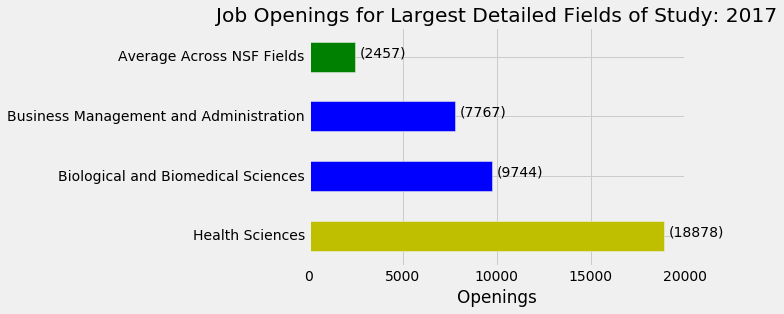

In [19]:
health_sciences_counts(pd.DataFrame(full_table[full_table['Year']==2017][['Health sciences', 'Biological and biomedical sciences', 'Business management and administration',
                                      'Agricultural sciences and natural resources', 'Chemistry',
                                      'Geosciences, atmospheric, and ocean sciences', 'Physics and astronomy',
                                      'Computer and information sciences', 'Mathematics and statistics', 'Psychology', 'Anthropology',
                                      'Economics', 'Political science and government', 'Sociology', 'Other social sciences',
                                      'Aerospace, aeronautical, and astronautical engineering',
                                      'Bioengineering and biomedical engineering', 'Chemical engineering', 'Civil engineering',
                                      'Electrical, electronics, and communications engineering',
                                      'Industrial and manufacturing engineering', 'Materials science engineering',
                                      'Mechanical engineering', 'Other engineering', 'Education administration', 'Education research',
                                      'Teacher education', 'Teaching fields', 'Other education', 'Foreign languages and literature',
                                      'History', 'Letters',  'Communication']].sum()).reset_index().rename(columns={0:'count'}), 'Job Openings for Largest Detailed Fields of Study: 2017')

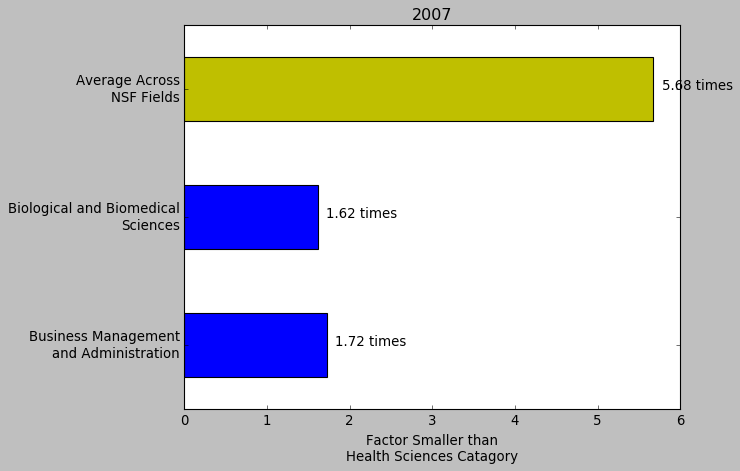

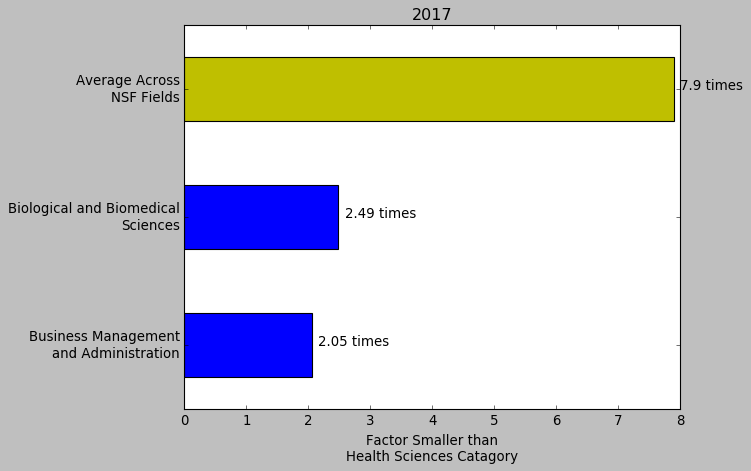

In [482]:
relative_sciences_factors(
    pd.DataFrame(full_table[full_table['Year']==2007][['Health sciences', 'Biological and biomedical sciences',
                                                   'Business management and administration', 
                                                   'Agricultural sciences and natural resources', 'Chemistry',
                                                   'Geosciences, atmospheric, and ocean sciences', 'Physics and astronomy',
                                                   'Computer and information sciences', 'Mathematics and statistics',
                                                   'Psychology', 'Anthropology', 'Economics', 
                                                   'Political science and government', 'Sociology', 'Other social sciences',
                                                   'Aerospace, aeronautical, and astronautical engineering',
                                                   'Bioengineering and biomedical engineering', 'Chemical engineering',
                                                   'Civil engineering',
                                                   'Electrical, electronics, and communications engineering',
                                                   'Industrial and manufacturing engineering',
                                                   'Materials science engineering','Mechanical engineering',
                                                   'Other engineering', 'Education administration', 'Education research',
                                                   'Teacher education', 'Teaching fields', 'Other education',
                                                   'Foreign languages and literature','History', 'Letters',
                                                   'Communication']].sum()).reset_index().rename(columns={0:'2007'}).merge(
pd.DataFrame(full_table[full_table['Year']==2017][['Health sciences', 'Biological and biomedical sciences',
                                                   'Business management and administration',
                                                   'Agricultural sciences and natural resources', 'Chemistry',
                                                   'Geosciences, atmospheric, and ocean sciences', 'Physics and astronomy',
                                                   'Computer and information sciences', 'Mathematics and statistics',
                                                   'Psychology', 'Anthropology','Economics', 
                                                   'Political science and government', 'Sociology', 'Other social sciences',
                                                   'Aerospace, aeronautical, and astronautical engineering',
                                                   'Bioengineering and biomedical engineering', 'Chemical engineering',
                                                   'Civil engineering',
                                                   'Electrical, electronics, and communications engineering',
                                                   'Industrial and manufacturing engineering',
                                                   'Materials science engineering', 'Mechanical engineering',
                                                   'Other engineering', 'Education administration', 'Education research',
                                                   'Teacher education', 'Teaching fields', 'Other education',
                                                   'Foreign languages and literature','History', 'Letters',
                                                   'Communication']].sum()).reset_index().rename(columns={0:'2017'}),
    on='index', how='inner'), 'null')

In [3]:
#############################################################
# Growth of Non-Faculty Job Postings by Career area 2010-2017
#############################################################

# Separate out all columns relevant to this evaluation:
full_table = main_table[['Job ID', 'Year', 'R1', 'Career Area']].merge(
    faculty_table[['Job ID', 'Faculty', 'Post-Doctoral']], how="inner", on="Job ID")


# Drop non-Faculty
full_table = full_table[(full_table['Faculty'] == 0) & (full_table['Post-Doctoral'] != 1)]
# Drop Career Areas with fewer than 1000 observation in 2017
full_table = full_table[(full_table['Career Area']!='Health Care including Nursing')&
                        (full_table['Career Area']!='Agriculture, Horticulture, & the Outdoors')&
                        (full_table['Career Area']!='Personal Services')&
                        (full_table['Career Area']!='Transportation')&
                        (full_table['Career Area']!='Performing Arts')&
                        (full_table['Career Area']!='na')]
# Restrict years of window
full_table = full_table[(full_table['Year']==2010)|(full_table['Year'] == 2017)]
# Restrict to R1 Institutions
full_table = full_table[full_table['Is Research 1 Institution?'] == 1]

,Year,Career Area,Job ID
0,2010,Business Management and Operations,12803
1,2010,Clerical and Administrative,16796
2,2010,Community and Social Services,7649
3,2010,"Construction, Extraction, and Architecture",1321
4,2010,Customer and Client Support,1064
5,2010,"Design, Media, and Writing",2839
6,2010,Education and Training,28057
7,2010,Engineering,2264
8,2010,Finance,8735
9,2010,"Hospitality, Food, and Tourism",5875


In [498]:
def Career_Area_Growth(df, title):
    catagories = list()
    counts = np.zeros((19,2))
    for index, row in df.iterrows():
        if row['Year'] == 2010:
            catagories.append(row['Career Area'])
            counts[index%19,0] = row['Job ID']
        if row['Year'] == 2017:
            counts[index%19,1] = row['Job ID']
        
    
    ind = np.array([x for x, _ in enumerate(catagories)])

    growth = np.true_divide((counts[:,0]-counts[:,1])*-1,counts[:,0]) * 100

    for k in range(len(growth)):
       # print(growth[k], counts[k,:], ind[k])
        plt.annotate(s=str(round(growth[k],1)) + '% Growth', xy=(counts[k,1]+250, ind[k]))
        
    width = 0.2
    
    plt.barh(ind, counts[:,1], width, label='2017', color='blue')
    plt.barh(ind + width, counts[:,0], width, label='2007', color='gold')

    plt.yticks(ind, catagories, fontsize='small')
    plt.ylabel('Career Area')
    plt.xlabel('Number of Postings')
    plt.title(title)

    plt.legend(loc='upper right')
    
    fig = plt.gcf()
    
    plt.show()

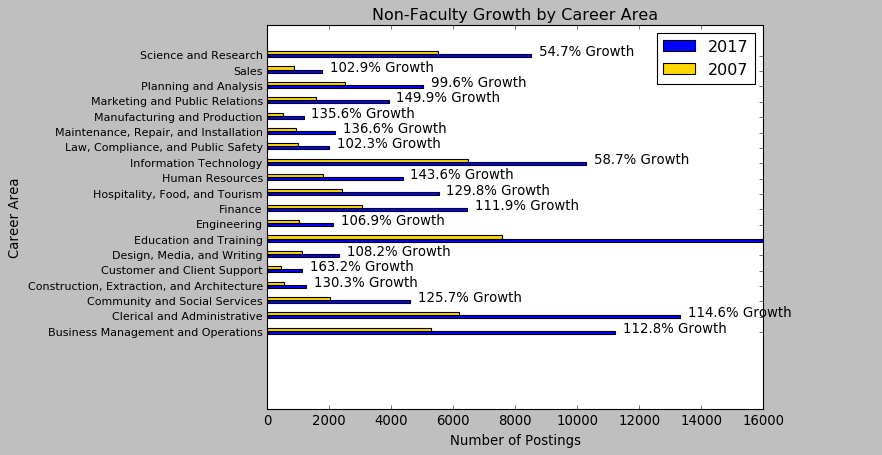

In [499]:
Career_Area_Growth(pd.DataFrame(full_table.groupby(['Year', 'Career Area']).count()['Job ID']).reset_index(),
                  'Non-Faculty Growth by Career Area')

In [506]:
del(full_table)

In [14]:
full_table = main_table[main_table['4-year']==1]
full_table = full_table[(full_table['Minimum EDU Requirements']==21)|(full_table['Maximum EDU Requirements']==21)]

pd.DataFrame(full_table['Job Title'].value_counts())

,Job Title
Assistant Professor,4302
Post-Doctoral Fellow,2054
Assistant/Associate Professor,1803
Post-Doctoral Research Associate,1679
Research Associate,1610
Math Instructor - Adjunct,1412
Research Assistant Professor,1392
Assistant Professor Of Psychology,1197
Post-Doctoral Associate,1108
Research Scientist,982


In [508]:
skill_table['Skill Name'].value_counts()

Communication Skills                                                     1290544
Research                                                                 1152833
Teaching                                                                 1143265
Planning                                                                  590632
Writing                                                                   581254
Teamwork / Collaboration                                                  560163
Organizational Skills                                                     546517
Budgeting                                                                 509213
Scheduling                                                                456328
Microsoft Office                                                          415640
Microsoft Excel                                                           391543
Computer Literacy                                                         390434
Problem Solving             

In [509]:
main_table['Career Area'].value_counts()

Education and Training                        1326725
Health Care including Nursing                  639416
na                                             311256
Clerical and Administrative                    260787
Information Technology                         213605
Business Management and Operations             189609
Finance                                        135449
Science and Research                           125264
Community and Social Services                  121138
Hospitality, Food, and Tourism                 102109
Human Resources                                 85344
Planning and Analysis                           69530
Marketing and Public Relations                  69135
Law, Compliance, and Public Safety              48088
Design, Media, and Writing                      48036
Engineering                                     47389
Maintenance, Repair, and Installation           44233
Sales                                           43622
Construction, Extraction, an

In [ ]:
full_table[full_table['Biological and biomedical sciences'] == 1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
full_table[full_table['Chemistry']==1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
full_table[full_table['Computer and information sciences']==1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
full_table[full_table['Geosciences, atmospheric, and ocean sciences']==1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
full_table[full_table['Mathematics and statistics']==1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
full_table[full_table['Physics and astronomy']==1].groupby(['Year', 'Tenured_Track', 'Contingent']).count()['Job ID']

In [ ]:
del(full_table)

In [ ]:
fig, ax1 = plt.subplots()
ax1.bar(0.1,height=0.5, width = 0.2, color='yellow')

ax2 = ax1.twinx()
ax2.bar(0.1, height=0.7, width = 0.1, color='blue')

In [ ]:
full_table[(full_table['Biological and biomedical sciences']==1) & (full_table['Tenured_Track'] != 1) & (full_table['Contingent'] != 1)]

In [46]:
for string in main_table.columns:
    print(string)

Unnamed: 0
Job ID
Year
Job Title
Occupation
Career Area
Minimum EDU Requirements
Maximum EDU Requirements
Minimum Experience Requirements
Annual Salary
Metropolitan Statistical Area
State
IPEDS Insitution Name
IPEDS Sector Name
Is Research 1 Institution?
4-year
2-year


In [47]:
for string in faculty_table.columns:
    print(string)

Unnamed: 0
Job ID
Year
Diversity and Inclusion
Post-Doctoral
Faculty
Agricultural sciences and natural resources
Biological and biomedical sciences
Health sciences
Chemistry
Geosciences, atmospheric, and ocean sciences
Physics and astronomy
Computer and information sciences
Mathematics and statistics
Psychology
Anthropology
Economics
Political science and government
Sociology
Other social sciences
Aerospace, aeronautical, and astronautical engineering
Bioengineering and biomedical engineering
Chemical engineering
Civil engineering
Electrical, electronics, and communications engineering
Industrial and manufacturing engineering
Materials science engineering
Mechanical engineering
Other engineering
Education administration
Education research
Teacher education
Teaching fields
Other education
Foreign languages and literature
History
Letters
Other humanities and arts
Business management and administration
Communication
Number of Detailed Fields of Study
FS_Life_sciences
FS_Physical_sciences_

In [21]:
del(skill_table)

In [ ]:
main_table['IPEDS Sector Name'].value_counts()

In [ ]:
faculty_table[['Faculty', 'Tenured', 'Tenured_Track', 'Part-time Contingent', 'Full-time Contingent','Contingent', 'Job ID']].groupby(by=['Faculty', 'Tenured', 'Tenured_Track','Contingent', 'Part-time Contingent', 'Full-time Contingent']).count()

In [ ]:
###############################################
# Adjusting Main Table for IPEDS Dummies:
# Note: Use orinal Main Table and Faculty Table
###############################################
full_table = main_table[['Job ID', 'IPEDS Sector Name']].merge(faculty_table[['Job ID', 'Faculty']], how='left', on='Job ID')
# 4-Year
four_year = full_table['IPEDS Sector Name'].str.contains('4-year')
four_year = four_year + (full_table['IPEDS Sector Name'].str.contains('Admin')&(full_table['Faculty']==1))
full_table['4-year'] = four_year + 0
# 2-Year
two_year = full_table['IPEDS Sector Name'].str.contains(', 2-year')
full_table['2-year'] = two_year + 0
fixed = main_table.merge(full_table[['Job ID', '4-year', '2-year']], on='Job ID', how='left')

In [5]:
faculty_table.drop_duplicates(subset=['Job ID'], keep='first', inplace=True)

In [17]:
faculty_table['Job ID'].value_counts()

120312930      1
291854798      1
38311980373    1
413639057      1
37891479796    1
120013197      1
38002971023    1
334017172      1
38011347329    1
37856160128    1
256895334      1
327925567      1
115394940      1
102822267      1
102818169      1
299952504      1
37956401522    1
38124169584    1
304132467      1
21996742       1
38258375018    1
119554413      1
37813774696    1
38115760494    1
38308694380    1
119538021      1
148912482      1
315883285      1
38120059227    1
38078497181    1
279407432      1
422048155      1
37927424439    1
38074145230    1
308615622      1
38078325185    1
38074132928    1
400898498      1
38137037253    1
38111998395    1
38277247540    1
37835200122    1
38032304568    1
37860319665    1
117985105      1
37956786614    1
110818307      1
304521649      1
38270301109    1
355273847      1
111559085      1
287728041      1
38158092716    1
103158183      1
37914818978    1
38044836257    1
38283909542    1
37889640868    1
38308081959   

In [8]:
faculty_table.to_csv(r"C:\Users\bob65\Documents\Summer2019_Research\PythonFiles\_Data\Brandeis_Dummy_Table_Radiology_Fixed.csv")

In [7]:
orig_table_NO_SAVE = pd.read_csv(r"C:\Users\bob65\Documents\Summer2019_Research\_SourceData\Brandeis_Dummy_Table_UPDATED_2-11-19.txt", sep='\t')

C:\Users\bob65\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [15]:
print(len(orig_table_NO_SAVE))
print(len(faculty_table)+16970)

3957168
3965791


In [16]:
test_table = orig_table_NO_SAVE.merge(faculty_table['Job ID'], how='left', on='Job ID', indicator=True).drop_duplicates(subset='Job ID', keep='first')

In [17]:
test_table[test_table['_merge']=='left_only']

,Job ID,Year,Diversity and Inclusion,Post-Doctoral,Faculty,Agricultural sciences and natural resources,Biological and biomedical sciences,Health sciences,Chemistry,"Geosciences, atmospheric, and ocean sciences",Physics and astronomy,Computer and information sciences,Mathematics and statistics,Psychology,Anthropology,Economics,Political science and government,Sociology,Other social sciences,"Aerospace, aeronautical, and astronautical engineering",Bioengineering and biomedical engineering,Chemical engineering,Civil engineering,"Electrical, electronics, and communications engineering",Industrial and manufacturing engineering,Materials science engineering,Mechanical engineering,Other engineering,Education administration,Education research,Teacher education,Teaching fields,Other education,Foreign languages and literature,History,Letters,Other humanities and arts,Business management and administration,Communication,Number of Detailed Fields of Study,FS_Life_sciences,FS_Physical_sciences_and_earth_sciences,FS_Mathematics_and_computer_sciences,FS_Psychology_and_social_sciences,FS_Engineering,FS_Education,FS_Humanities_and_arts,FS_Others,Tenured,Tenured_Track,Contingent,Full-time Contingent,Part-time Contingent,_merge
0,263295897,2007.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,left_only
1,263296995,2007.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
2,263327244,2007.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
3,263334496,2007.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
4,263334558,2007.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,left_only
5,263335925,2007.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
6,263336051,2007.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
7,263340331,2007.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,left_only
8,263340361,2007.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only
9,263340885,2007.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,left_only


In [ ]:
len(test_table)

In [19]:
del(test_table)

In [15]:
orig_table_NO_SAVE['Job ID'].value_counts()

38143000575    1
491668621      1
37835387198    1
313143612      1
37835387194    1
37977993523    1
38256952900    1
37835387176    1
38246542695    1
286127106      1
287977763      1
740962594      1
37933650159    1
321532189      1
321532187      1
321532184      1
321532181      1
10649560       1
279589136      1
37910884622    1
38279983373    1
37977993484    1
38078656775    1
38003159302    1
37835387141    1
438972674      1
37835387137    1
413806844      1
38078656762    1
313143615      1
24571815       1
120205636      1
313143655      1
288062247      1
338309506      1
329195029      1
145559650      1
38145497789    1
38263206267    1
38268800849    1
328050596      1
304755061      1
37969604980    1
313143657      1
38263206248    1
38061879654    1
120205638      1
262812004      1
38011548001    1
38263206240    1
254423388      1
38238040407    1
38061879638    1
37810221392    1
237646157      1
339570137      1
37986382154    1
37835387209    1
37810221384   

In [ ]:
######################
# Data Generation Code
######################

# (3) Tenure_Line / Contingent Manipualtion
# Clarify the Tenure Line variable
faculty_table['Tenure_Line'] = faculty_table['Tenured'] + faculty_table['Tenured_Track']
faculty_table['Tenure_Line'].where(faculty_table['Tenure_Line'] < 2, 1, inplace=True)

# Mutually exclude Tenure-Line and Contingent
'''
If Tenure-Line is 1 AND Contingent is 0 OR Tenure-Line is 0 AND Contingent is 1, leave contingent alone;
Otherwise it must be replaced with 0
'''
faculty_table['Contingent'].where(((faculty_table['Tenure_Line'] > 0) & (faculty_table['Contingent'] < 1) |
                                (faculty_table['Tenure_Line'] < 1) & (faculty_table['Contingent'] > 0)), 0, inplace=True)
'''
If Tenure-Line is 1, FTC and PTC should be 0
'''
faculty_table['Full-time Contingent'].where(faculty_table['Tenure_Line'] < 1, 0, inplace=True)
faculty_table['Part-time Contingent'].where(faculty_table['Tenure_Line'] < 1, 0, inplace=True)

#########################

# (3) Parse IPEDS Column:
# 4-year
four_year = full_table['IPEDS Sector Name'].str.contains('4-year')
four_year = four_year + full_table['IPEDS Sector Name'].str.contains('Admin')
full_table['4-year'] = four_year + 0
# 2-Year
two_year = full_table['IPEDS Sector Name'].str.contains(', 2-year')
full_table['2-year'] = two_year + 0

# (4) Drop now useless columns
full_table = full_table[['Job ID', 'Year', 'Faculty', 'R1', '4-year', '2-year']]